In [ ]:
# Author: Enock Niyonkuru
# Class: Deep Learning
# Topic: Generative Adversarial Networks (GANs)
# Date:  20 Apirl 2022
# This project predicts the items in an image using GANs and YOLO5

# **Deep_learing Project TL_GANs:**
*   Fine tune Pre-trained models to predict image labels in new dataset **[Cats vs Dogs]**
*   Use YOLO5 to detect and count objects from images. **(URLs provided)**
*   Generate Minecraft images with pre-trained StyleGAN **(URL provided)**
*   Finetune Generated images.
*   Morph a video with generated images.










In [7]:
import os
import torch
import torchvision
import tarfile
import torch.nn as nn
import numpy as np
import torch.nn.functional as F
from torchvision.datasets.utils import download_url
from torchvision.datasets import ImageFolder
from torch.utils.data import DataLoader
from torchvision.transforms import ToTensor
import torchvision.transforms as tt
from torch.utils.data import random_split
from torchvision.utils import make_grid
import matplotlib.pyplot as plt
import torchvision.models as models
%matplotlib inline
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import tensorflow as tf
import pandas as pd
import tensorflow.keras
import matplotlib.pyplot as plt
from tensorflow.keras.applications.resnet50 import ResNet50
from tensorflow.keras.layers import Input
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.metrics import RootMeanSquaredError
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D
from tensorflow.keras.models import Model
import matplotlib.image  as mpimg
import matplotlib.pyplot as plt
from tensorflow.keras.layers import Dense,GlobalAveragePooling2D
from tensorflow.keras.applications import MobileNet
from tensorflow.keras.preprocessing import image
from tensorflow.keras.applications.mobilenet import preprocess_input
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.optimizers import RMSprop
from keras.preprocessing import image
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.layers import Dense, Flatten, Conv2D, MaxPooling2D, Dropout, BatchNormalization
from tensorflow.keras.layers import Dense,GlobalAveragePooling2D
from tensorflow.keras.applications import MobileNet
from tensorflow.keras.preprocessing import image
from tensorflow.keras.applications.mobilenet import preprocess_input
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from shutil import copyfile
from io import BytesIO
from IPython.display import display, HTML
from tensorflow.keras.applications.mobilenet import decode_predictions
from google.colab.patches import cv2_imshow
from PIL import Image
from collections import Counter
import random 

In [8]:
import zipfile

In [9]:
# If the URL doesn't work, visit https://www.microsoft.com/en-us/download/confirmation.aspx?id=54765
# And right click on the 'Download Manually' link to get a new URL to the dataset

# Note: This is a very large dataset and will take time to download

!wget --no-check-certificate \
    "https://download.microsoft.com/download/3/E/1/3E1C3F21-ECDB-4869-8368-6DEBA77B919F/kagglecatsanddogs_3367a.zip" \
    -O "/tmp/cats-and-dogs.zip"

local_zip = '/tmp/cats-and-dogs.zip'
zip_ref   = zipfile.ZipFile(local_zip, 'r')
zip_ref.extractall('/tmp')
zip_ref.close()


print(len(os.listdir('/tmp/PetImages/Cat/')))
print(len(os.listdir('/tmp/PetImages/Dog/')))


--2022-04-21 03:54:49--  https://download.microsoft.com/download/3/E/1/3E1C3F21-ECDB-4869-8368-6DEBA77B919F/kagglecatsanddogs_3367a.zip
Resolving download.microsoft.com (download.microsoft.com)... 184.29.128.114, 2600:141b:5000:598::e59, 2600:141b:5000:597::e59
Connecting to download.microsoft.com (download.microsoft.com)|184.29.128.114|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 824894548 (787M) [application/octet-stream]
Saving to: ‘/tmp/cats-and-dogs.zip’

/tmp/cats-and-dogs. 100%[===================>] 786.68M   196MB/s    in 4.2s    

2022-04-21 03:54:53 (189 MB/s) - ‘/tmp/cats-and-dogs.zip’ saved [824894548/824894548]

12501
12501


# **Task 1:** Finetune Resnet50 Model and to predict Cats/Dogs. Print Accuracy.


In [10]:
# Split into training (90%) and validation/test (10%) data 
# Split data into separate folders for training and test images


def split_data(SOURCE, TRAINING, TESTING, SPLIT_SIZE):
    files = []
    for filename in os.listdir(SOURCE):
        file = SOURCE + filename
        if os.path.getsize(file) > 0:
            files.append(filename)
        else:
            print(filename + " is zero length, so ignoring.")

    training_length = int(len(files) * SPLIT_SIZE)
    testing_length = int(len(files) - training_length)
    shuffled_set = random.sample(files, len(files))
    training_set = shuffled_set[0:training_length]
    testing_set = shuffled_set[-testing_length:]

    for filename in training_set:
        this_file = SOURCE + filename
        destination = TRAINING + filename
        copyfile(this_file, destination)

    for filename in testing_set:
        this_file = SOURCE + filename
        destination = TESTING + filename
        copyfile(this_file, destination)

try:
    os.mkdir('/tmp/cats-v-dogs')
    os.mkdir('/tmp/cats-v-dogs/training')
    os.mkdir('/tmp/cats-v-dogs/testing')
    os.mkdir('/tmp/cats-v-dogs/training/cats')
    os.mkdir('/tmp/cats-v-dogs/training/dogs')
    os.mkdir('/tmp/cats-v-dogs/testing/cats')
    os.mkdir('/tmp/cats-v-dogs/testing/dogs')
except OSError:
    pass

    
CAT_SOURCE_DIR = "/tmp/PetImages/Cat/"
TRAINING_CATS_DIR = "/tmp/cats-v-dogs/training/cats/"
TESTING_CATS_DIR = "/tmp/cats-v-dogs/testing/cats/"
DOG_SOURCE_DIR = "/tmp/PetImages/Dog/"
TRAINING_DOGS_DIR = "/tmp/cats-v-dogs/training/dogs/"
TESTING_DOGS_DIR = "/tmp/cats-v-dogs/testing/dogs/"

split_size = .9
split_data(CAT_SOURCE_DIR, TRAINING_CATS_DIR, TESTING_CATS_DIR, split_size)
split_data(DOG_SOURCE_DIR, TRAINING_DOGS_DIR, TESTING_DOGS_DIR, split_size)



print(len(os.listdir('/tmp/cats-v-dogs/training/cats/')))
print(len(os.listdir('/tmp/cats-v-dogs/training/dogs/')))
print(len(os.listdir('/tmp/cats-v-dogs/testing/cats/')))
print(len(os.listdir('/tmp/cats-v-dogs/testing/dogs/')))



666.jpg is zero length, so ignoring.
11702.jpg is zero length, so ignoring.
11250
11250
1250
1250


In [11]:
from tensorflow.keras.applications.resnet50 import ResNet50
from tensorflow.keras.layers import Input

WIDTH = 256
HEIGHT = 256
input_tensor = Input(shape=(HEIGHT, WIDTH, 3))

base_model = ResNet50(
    include_top=False, weights=None, input_tensor=input_tensor,
    input_shape=None)

In [12]:
for i in range(len(base_model.layers)):
  base_model.layers[i].trainable = False

In [13]:
for i in range(50, 75):
  base_model.layers[i].trainable = True

In [14]:
base_model.summary()

Model: "resnet50"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 256, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv1_pad (ZeroPadding2D)      (None, 262, 262, 3)  0           ['input_1[0][0]']                
                                                                                                  
 conv1_conv (Conv2D)            (None, 128, 128, 64  9472        ['conv1_pad[0][0]']              
                                )                                                                 
                                                                                           

In [15]:
# Design the train and validation generator
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# All images will be rescaled by 1./255
train_datagen = ImageDataGenerator(rescale=1/255)

# Flow training images in batches of 128 using train_datagen generator
train_generator = train_datagen.flow_from_directory(
        '/tmp/cats-v-dogs/training/',  # This is the source directory for training images
        target_size=(300, 300),  # All images will be resized to 150x150
        batch_size=128,
        # Since we use binary_crossentropy loss, we need binary labels
        class_mode='binary')

validation_datagen = ImageDataGenerator(rescale=1/255)

# Flow training images in batches of 128 using train_datagen generator
val_generator = validation_datagen.flow_from_directory(
        '/tmp/cats-v-dogs/testing/',  # This is the source directory for training images
        target_size=(300, 300),  # All images will be resized to 150x150
        batch_size=32,
        # Since we use binary_crossentropy loss, we need binary labels
        class_mode='binary')

Found 22499 images belonging to 2 classes.
Found 2499 images belonging to 2 classes.


In [16]:
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D
from tensorflow.keras.models import Model

x=base_model.output
x=GlobalAveragePooling2D()(x)
x=Dense(1024,activation='relu')(x) 
x=Dense(1024,activation='relu')(x) 
model=Model(inputs=base_model.input,outputs=Dense(1)(x))

In [17]:
from tensorflow.keras.optimizers import RMSprop

model.compile(loss='binary_crossentropy',
              optimizer=RMSprop(lr=0.001),
              metrics=['accuracy'])

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/rmsprop.py:130: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(RMSprop, self).__init__(name, **kwargs)


In [ ]:
#model.compile(loss = 'binary_crossentropy', optimizer='adam', 
              #metrics=['acuracy'])

In [ ]:
from tensorflow.keras.callbacks import EarlyStopping
#from tensorflow.keras.metrics import RootMeanSquaredError
from tensorflow.keras.preprocessing.image import ImageDataGenerator
# Important, calculate a valid step size for the validation dataset
#STEP_SIZE_VALID=val_generator.n//val_generator.batch_size


monitor = EarlyStopping(monitor='val_loss', min_delta=1e-3, patience=5, 
                        verbose=1, mode='auto', restore_best_weights=True)

history = model.fit(train_generator, epochs=10, steps_per_epoch=25, 
                    validation_data = val_generator, callbacks=[monitor],
                    verbose = 1, validation_steps=8)
# history = model.fit(
#       train_generator,
#       validation_data = val_generator,  
#       epochs=12,
#       steps_per_epoch=90,
#       validation_steps=90,
#       verbose=1)

Epoch 1/10
25/25 [==============================] - 65s 2s/step - loss: 7.4577 - accuracy: 0.4904 - val_loss: 7.8033 - val_accuracy: 0.4883
Epoch 2/10
25/25 [==============================] - 39s 2s/step - loss: 7.5913 - accuracy: 0.5022 - val_loss: 8.2203 - val_accuracy: 0.4609
Epoch 3/10
10/25 [===========>..................] - ETA: 22s - loss: 7.6008 - accuracy: 0.5016

/usr/local/lib/python3.7/dist-packages/PIL/TiffImagePlugin.py:770: UserWarning: Possibly corrupt EXIF data.  Expecting to read 32 bytes but only got 0. Skipping tag 270
  " Skipping tag %s" % (size, len(data), tag)
/usr/local/lib/python3.7/dist-packages/PIL/TiffImagePlugin.py:770: UserWarning: Possibly corrupt EXIF data.  Expecting to read 5 bytes but only got 0. Skipping tag 271
  " Skipping tag %s" % (size, len(data), tag)
/usr/local/lib/python3.7/dist-packages/PIL/TiffImagePlugin.py:770: UserWarning: Possibly corrupt EXIF data.  Expecting to read 8 bytes but only got 0. Skipping tag 272
  " Skipping tag %s" % (size, len(data), tag)
/usr/local/lib/python3.7/dist-packages/PIL/TiffImagePlugin.py:770: UserWarning: Possibly corrupt EXIF data.  Expecting to read 8 bytes but only got 0. Skipping tag 282
  " Skipping tag %s" % (size, len(data), tag)
/usr/local/lib/python3.7/dist-packages/PIL/TiffImagePlugin.py:770: UserWarning: Possibly corrupt EXIF data.  Expecting to read 8 bytes but only

25/25 [==============================] - 39s 2s/step - loss: 7.5627 - accuracy: 0.5041 - val_loss: 8.3990 - val_accuracy: 0.4492
Epoch 4/10
 9/25 [=========>....................] - ETA: 22s - loss: 7.6643 - accuracy: 0.4974

In [ ]:
from sklearn.metrics import accuracy_score
import numpy as np

val_generator.reset()
pred = model.predict(val_generator)

predict_classes = np.argmax(pred,axis=1)
expected_classes = val_generator.classes

correct = accuracy_score(expected_classes,predict_classes)
print(f"Accuracy: {correct}")

Accuracy: 0.5003697677858305


# **Task 2:** Finetune MobileNet Model and train to predict Cats/Dogs. Compare Accuracy 

In [ ]:
# Split into training (90%) and validation/test (10%) data 
# Split data into separate folders for training and test images


def split_data(SOURCE, TRAINING, TESTING, SPLIT_SIZE):
    files = []
    for filename in os.listdir(SOURCE):
        file = SOURCE + filename
        if os.path.getsize(file) > 0:
            files.append(filename)
        else:
            print(filename + " is zero length, so ignoring.")

    training_length = int(len(files) * SPLIT_SIZE)
    testing_length = int(len(files) - training_length)
    shuffled_set = random.sample(files, len(files))
    training_set = shuffled_set[0:training_length]
    testing_set = shuffled_set[-testing_length:]

    for filename in training_set:
        this_file = SOURCE + filename
        destination = TRAINING + filename
        copyfile(this_file, destination)

    for filename in testing_set:
        this_file = SOURCE + filename
        destination = TESTING + filename
        copyfile(this_file, destination)

try:
    os.mkdir('/tmp/cats-v-dogs')
    os.mkdir('/tmp/cats-v-dogs/training')
    os.mkdir('/tmp/cats-v-dogs/testing')
    os.mkdir('/tmp/cats-v-dogs/training/cats')
    os.mkdir('/tmp/cats-v-dogs/training/dogs')
    os.mkdir('/tmp/cats-v-dogs/testing/cats')
    os.mkdir('/tmp/cats-v-dogs/testing/dogs')
except OSError:
    pass

    
CAT_SOURCE_DIR = "/tmp/PetImages/Cat/"
TRAINING_CATS_DIR = "/tmp/cats-v-dogs/training/cats/"
TESTING_CATS_DIR = "/tmp/cats-v-dogs/testing/cats/"
DOG_SOURCE_DIR = "/tmp/PetImages/Dog/"
TRAINING_DOGS_DIR = "/tmp/cats-v-dogs/training/dogs/"
TESTING_DOGS_DIR = "/tmp/cats-v-dogs/testing/dogs/"

split_size = .9
split_data(CAT_SOURCE_DIR, TRAINING_CATS_DIR, TESTING_CATS_DIR, split_size)
split_data(DOG_SOURCE_DIR, TRAINING_DOGS_DIR, TESTING_DOGS_DIR, split_size)



print(len(os.listdir('/tmp/cats-v-dogs/training/cats/')))
print(len(os.listdir('/tmp/cats-v-dogs/training/dogs/')))
print(len(os.listdir('/tmp/cats-v-dogs/testing/cats/')))
print(len(os.listdir('/tmp/cats-v-dogs/testing/dogs/')))



666.jpg is zero length, so ignoring.
11702.jpg is zero length, so ignoring.
12500
12500
5109
5120


In [ ]:
from tensorflow.keras.applications.resnet50 import ResNet50
from tensorflow.keras.layers import Input

WIDTH = 256
HEIGHT = 256
input_tensor = Input(shape=(HEIGHT, WIDTH, 3))

base_model = MobileNet(
    include_top=False, weights=None, input_tensor=input_tensor,
    input_shape=None)

In [ ]:
# Load Pre-Trained Model
# Mobile Net
model = MobileNet(weights='imagenet',include_top=True)
model.summary()

In [ ]:
for i in range(len(base_model.layers)):
  base_model.layers[i].trainable = False

In [ ]:
for i in range(50, 75):
  base_model.layers[i].trainable = True

In [ ]:
base_model.summary()

Model: "mobilenet_1.00_None"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_5 (InputLayer)        [(None, 256, 256, 3)]     0         
                                                                 
 conv1 (Conv2D)              (None, 128, 128, 32)      864       
                                                                 
 conv1_bn (BatchNormalizatio  (None, 128, 128, 32)     128       
 n)                                                              
                                                                 
 conv1_relu (ReLU)           (None, 128, 128, 32)      0         
                                                                 
 conv_dw_1 (DepthwiseConv2D)  (None, 128, 128, 32)     288       
                                                                 
 conv_dw_1_bn (BatchNormaliz  (None, 128, 128, 32)     128       
 ation)                                        

In [ ]:
# Design the train and validation generator
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# All images will be rescaled by 1./255
train_datagen = ImageDataGenerator(rescale=1/255)

# Flow training images in batches of 128 using train_datagen generator
train_generator = train_datagen.flow_from_directory(
        '/tmp/cats-v-dogs/training/',  # This is the source directory for training images
        target_size=(300, 300),  # All images will be resized to 150x150
        batch_size=32,
        # Since we use binary_crossentropy loss, we need binary labels
        class_mode='binary')

validation_datagen = ImageDataGenerator(rescale=1/255)

# Flow training images in batches of 128 using train_datagen generator
val_generator = validation_datagen.flow_from_directory(
        '/tmp/cats-v-dogs/testing/',  # This is the source directory for training images
        target_size=(300, 300),  # All images will be resized to 150x150
        batch_size=32,
        # Since we use binary_crossentropy loss, we need binary labels
        class_mode='binary')

In [ ]:
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D
from tensorflow.keras.models import Model

x=base_model.output
x=GlobalAveragePooling2D()(x)
x=Dense(1024,activation='relu')(x) 
x=Dense(1024,activation='relu')(x) 
model=Model(inputs=base_model.input,outputs=Dense(1)(x))

In [ ]:
from tensorflow.keras.optimizers import RMSprop

model.compile(loss='binary_crossentropy',
              optimizer=RMSprop(lr=0.001),
              metrics=['accuracy'])

In [ ]:
from tensorflow.keras.callbacks import EarlyStopping
#from tensorflow.keras.metrics import RootMeanSquaredError
from tensorflow.keras.preprocessing.image import ImageDataGenerator
# Important, calculate a valid step size for the validation dataset
#STEP_SIZE_VALID=val_generator.n//val_generator.batch_size


monitor = EarlyStopping(monitor='val_loss', min_delta=1e-3, patience=5, 
                        verbose=1, mode='auto', restore_best_weights=True)

history = model.fit(train_generator, epochs=10, steps_per_epoch=25, 
                    validation_data = val_generator, callbacks=[monitor],
                    verbose = 1, validation_steps=8)

Epoch 1/100
250/250 [==============================] - 121s 471ms/step - loss: 4.9148 - accuracy: 0.5290 - val_loss: 7.7287 - val_accuracy: 0.4990
Epoch 2/100
250/250 [==============================] - 116s 464ms/step - loss: 7.7047 - accuracy: 0.5005 - val_loss: 7.7287 - val_accuracy: 0.4990
Epoch 3/100
250/250 [==============================] - 116s 465ms/step - loss: 7.6951 - accuracy: 0.5011 - val_loss: 7.7287 - val_accuracy: 0.4990
Epoch 4/100
250/250 [==============================] - 116s 464ms/step - loss: 7.7512 - accuracy: 0.4975 - val_loss: 7.7287 - val_accuracy: 0.4990
Epoch 5/100
250/250 [==============================] - 117s 467ms/step - loss: 7.6874 - accuracy: 0.5016 - val_loss: 7.7287 - val_accuracy: 0.4990
Epoch 6/100
250/250 [==============================] - 116s 465ms/step - loss: 7.6448 - accuracy: 0.5044 - val_loss: 7.7287 - val_accuracy: 0.4990
Epoch 6: early stopping


In [ ]:
from sklearn.metrics import accuracy_score
import numpy as np

validation_generator.reset()
pred = model.predict(validation_generator)

predict_classes = np.argmax(pred,axis=1)
expected_classes = validation_generator.classes

correct = accuracy_score(expected_classes,predict_classes)
print(f"Accuracy: {correct}")

Accuracy: 0.5


# **Task 3:** Detect objects in the following images using YOLO5. Print all objects detected.

In [1]:
URL_1 = 'https://thumbs.dreamstime.com/z/happy-people-cooking-food-together-kitchen-175654232.jpg'
URL_2 = 'https://assets.bwbx.io/images/users/iqjWHBFdfxIU/iF7FZ1YWoHCs/v1/-1x-1.jpg'
URL_3 = 'https://www.rocketlawyer.com/binaries/content/gallery/guide-hero-images/US/legal-steps-to-stop-an-unsafe-senior-from-driving-1159637659.jpg'
URL_4 = 'https://techcrunch.com/wp-content/uploads/2014/09/shutterstock_132468212.jpg'
URL_5 = 'https://cdn.choosechicago.com/uploads/2019/05/20160419_IHG_InterCon_542_clean_81309dad-ec1a-4771-bf17-5f55a8bc3740-2400x1600.jpg'


In [2]:
!git clone https://github.com/ultralytics/yolov5
%cd /content/yolov5
%pip install -qr requirements.txt

from yolov5 import utils
display = utils.notebook_init()

YOLOv5 🚀 v6.1-143-g6ea81bb torch 1.10.0+cu111 CUDA:0 (Tesla T4, 15110MiB)


Setup complete ✅ (2 CPUs, 12.7 GB RAM, 39.9/78.2 GB disk)


In [3]:
import argparse
import os
import sys
from pathlib import Path

import cv2
import torch
import torch.backends.cudnn as cudnn

from models.common import DetectMultiBackend
from utils.datasets import IMG_FORMATS, VID_FORMATS, LoadImages, LoadStreams
from utils.general import (LOGGER, check_file, check_img_size, check_imshow, check_requirements, colorstr,
                           increment_path, non_max_suppression, print_args, scale_coords, strip_optimizer, xyxy2xywh)
from utils.plots import Annotator, colors, save_one_box
from utils.torch_utils import select_device, time_sync
import numpy as np

device = select_device('')
weights = '/content/yolov5/yolov5s.pt'

YOLOv5 🚀 v6.1-143-g6ea81bb torch 1.10.0+cu111 CUDA:0 (Tesla T4, 15110MiB)



In [4]:
import cv2 as cv 
from google.colab.patches import cv2_imshow # for image display

## All images' content

In [5]:
def image_content (URL_1):
  from PIL import Image
  import requests
  from io import BytesIO
  import torchvision.transforms.functional as TF

  response = requests.get(URL_1,headers={'User-Agent': 'Mozilla/5.0'})
  img = Image.open(BytesIO(response.content))

  device = select_device('')
  weights = '/content/yolov5/yolov5s.pt'
  imgsz = [img.height, img.width]
  original_size = imgsz
  model = DetectMultiBackend(weights, device=device, dnn=False)
  stride, names, pt, jit, onnx, engine = model.stride, model.names, model.pt, model.jit, model.onnx, model.engine
  imgsz = check_img_size(imgsz, s=stride)  # check image size

  source = '/content/images/'
  half = False
  conf_thres=0.25  # confidence threshold
  iou_thres=0.45  # NMS IOU threshold
  classes = None
  agnostic_nms=False,  # class-agnostic NMS
  max_det=1000
  model.warmup(imgsz=(1, 3, *imgsz))  # warmup
  #model.warmup(imgsz=(1, 3, *imgsz), half=half)  # warmup
  dt, seen = [0.0, 0.0, 0.0], 0

  img2 = img.resize([imgsz[1],imgsz[0]], Image.ANTIALIAS)
      
  img_raw = torch.from_numpy(np.asarray(img2)).to(device)
  img_raw = img_raw.half() if half else img_raw.float()  
  img_raw /= 255  # 0 - 255 to 0.0 - 1.0
  img_raw = img_raw.unsqueeze_(0)
  img_raw = img_raw.permute(0, 3, 1, 2)
  print(img_raw.shape)

  pred = model(img_raw, augment=False, visualize=False)
  pred = non_max_suppression(pred, conf_thres, iou_thres, classes, agnostic_nms, max_det=max_det)

  results = []
  for i, det in enumerate(pred):  # per image
    gn = torch.tensor(img_raw.shape)[[1, 0, 1, 0]]  

    if len(det):
        # Rescale boxes from img_size to im0 size
        det[:, :4] = scale_coords(original_size, det[:, :4], imgsz).round()

        # Write results
        for *xyxy, conf, cls in reversed(det):
          xywh = (xyxy2xywh(torch.tensor(xyxy).view(1, 4)) / gn).view(-1).tolist()
          # Choose between xyxy and xywh as your desired format.
          results.append([names[int(cls)], float(conf), [*xyxy]])
  for itm in results:
    print(itm)

  from PIL import Image, ImageDraw
  print(" ")
  img3 = img.copy()
  draw = ImageDraw.Draw(img3)

  for itm in results:
    b = itm[2]
    #print(b)
    draw.rectangle(b)
  img3
  #img3.show()
  #cv_imshow(img3)
  #cv2_imshow(img3)

In [6]:
images_list = [URL_1, URL_2, URL_3, URL_5]
count = 1
for i in images_list:
  print('')
  print('Image: ', count)
  image_content (i)
  count= count +1

YOLOv5 🚀 v6.1-143-g6ea81bb torch 1.10.0+cu111 CUDA:0 (Tesla T4, 15110MiB)




Image:  1


  0%|          | 0.00/14.1M [00:00<?, ?B/s]

Fusing layers... 
YOLOv5s summary: 213 layers, 7225885 parameters, 0 gradients, 16.5 GFLOPs
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:31: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  ../torch/csrc/utils/tensor_numpy.cpp:189.)


torch.Size([1, 3, 1184, 1600])
['bottle', 0.25132277607917786, [tensor(710., device='cuda:0'), tensor(1086., device='cuda:0'), tensor(788., device='cuda:0'), tensor(1119., device='cuda:0')]]
['donut', 0.2543598413467407, [tensor(690., device='cuda:0'), tensor(767., device='cuda:0'), tensor(779., device='cuda:0'), tensor(846., device='cuda:0')]]
['person', 0.26553988456726074, [tensor(61., device='cuda:0'), tensor(384., device='cuda:0'), tensor(463., device='cuda:0'), tensor(1063., device='cuda:0')]]
['apple', 0.3028523623943329, [tensor(887., device='cuda:0'), tensor(851., device='cuda:0'), tensor(970., device='cuda:0'), tensor(928., device='cuda:0')]]
['apple', 0.33291757106781006, [tensor(571., device='cuda:0'), tensor(927., device='cuda:0'), tensor(680., device='cuda:0'), tensor(1014., device='cuda:0')]]
['person', 0.34400928020477295, [tensor(1132., device='cuda:0'), tensor(294., device='cuda:0'), tensor(1600., device='cuda:0'), tensor(920., device='cuda:0')]]
['bowl', 0.3688504397

YOLOv5 🚀 v6.1-143-g6ea81bb torch 1.10.0+cu111 CUDA:0 (Tesla T4, 15110MiB)

Fusing layers... 
YOLOv5s summary: 213 layers, 7225885 parameters, 0 gradients, 16.5 GFLOPs


torch.Size([1, 3, 1504, 2016])
['person', 0.251094251871109, [tensor(597., device='cuda:0'), tensor(53., device='cuda:0'), tensor(734., device='cuda:0'), tensor(160., device='cuda:0')]]
['person', 0.25482895970344543, [tensor(1889., device='cuda:0'), tensor(494., device='cuda:0'), tensor(1988., device='cuda:0'), tensor(710., device='cuda:0')]]
['person', 0.2647480070590973, [tensor(653., device='cuda:0'), tensor(558., device='cuda:0'), tensor(1190., device='cuda:0'), tensor(1191., device='cuda:0')]]
['person', 0.3050256669521332, [tensor(1838., device='cuda:0'), tensor(56., device='cuda:0'), tensor(1939., device='cuda:0'), tensor(256., device='cuda:0')]]
['person', 0.3077152967453003, [tensor(183., device='cuda:0'), tensor(240., device='cuda:0'), tensor(300., device='cuda:0'), tensor(426., device='cuda:0')]]
['person', 0.3215577006340027, [tensor(834., device='cuda:0'), tensor(112., device='cuda:0'), tensor(947., device='cuda:0'), tensor(230., device='cuda:0')]]
['person', 0.3427508473

YOLOv5 🚀 v6.1-143-g6ea81bb torch 1.10.0+cu111 CUDA:0 (Tesla T4, 15110MiB)

Fusing layers... 
YOLOv5s summary: 213 layers, 7225885 parameters, 0 gradients, 16.5 GFLOPs


torch.Size([1, 3, 1152, 2048])
['person', 0.26172327995300293, [tensor(849., device='cuda:0'), tensor(539., device='cuda:0'), tensor(1479., device='cuda:0'), tensor(1152., device='cuda:0')]]
['chair', 0.30173391103744507, [tensor(244., device='cuda:0'), tensor(1040., device='cuda:0'), tensor(616., device='cuda:0'), tensor(1152., device='cuda:0')]]
['person', 0.39948785305023193, [tensor(542., device='cuda:0'), tensor(478., device='cuda:0'), tensor(1159., device='cuda:0'), tensor(1135., device='cuda:0')]]
['person', 0.4918564558029175, [tensor(590., device='cuda:0'), tensor(156., device='cuda:0'), tensor(1235., device='cuda:0'), tensor(817., device='cuda:0')]]
['car', 0.6625561118125916, [tensor(1963., device='cuda:0'), tensor(471., device='cuda:0'), tensor(2048., device='cuda:0'), tensor(632., device='cuda:0')]]
 

Image:  4


YOLOv5 🚀 v6.1-143-g6ea81bb torch 1.10.0+cu111 CUDA:0 (Tesla T4, 15110MiB)

Fusing layers... 
YOLOv5s summary: 213 layers, 7225885 parameters, 0 gradients, 16.5 GFLOPs


torch.Size([1, 3, 1216, 1824])
['chair', 0.2522907257080078, [tensor(404., device='cuda:0'), tensor(641., device='cuda:0'), tensor(448., device='cuda:0'), tensor(679., device='cuda:0')]]
['chair', 0.26425954699516296, [tensor(442., device='cuda:0'), tensor(645., device='cuda:0'), tensor(488., device='cuda:0'), tensor(704., device='cuda:0')]]
['chair', 0.3098115026950836, [tensor(513., device='cuda:0'), tensor(640., device='cuda:0'), tensor(576., device='cuda:0'), tensor(692., device='cuda:0')]]
['chair', 0.328327476978302, [tensor(444., device='cuda:0'), tensor(642., device='cuda:0'), tensor(486., device='cuda:0'), tensor(669., device='cuda:0')]]
['chair', 0.3432125747203827, [tensor(480., device='cuda:0'), tensor(642., device='cuda:0'), tensor(518., device='cuda:0'), tensor(710., device='cuda:0')]]
['bench', 0.37358206510543823, [tensor(778., device='cuda:0'), tensor(642., device='cuda:0'), tensor(830., device='cuda:0'), tensor(675., device='cuda:0')]]
['chair', 0.3950185775756836, [t

## Frist Image

YOLOv5 🚀 v6.1-142-g918d7b2 torch 1.10.0+cu111 CUDA:0 (Tesla K80, 11441MiB)

Fusing layers... 
YOLOv5s summary: 213 layers, 7225885 parameters, 0 gradients, 16.5 GFLOPs


torch.Size([1, 3, 1184, 1600])
['bottle', 0.25132259726524353, [tensor(710., device='cuda:0'), tensor(1086., device='cuda:0'), tensor(788., device='cuda:0'), tensor(1119., device='cuda:0')]]
['donut', 0.2543584108352661, [tensor(690., device='cuda:0'), tensor(767., device='cuda:0'), tensor(779., device='cuda:0'), tensor(846., device='cuda:0')]]
['person', 0.2655395269393921, [tensor(61., device='cuda:0'), tensor(384., device='cuda:0'), tensor(463., device='cuda:0'), tensor(1063., device='cuda:0')]]
['apple', 0.30285215377807617, [tensor(887., device='cuda:0'), tensor(851., device='cuda:0'), tensor(970., device='cuda:0'), tensor(928., device='cuda:0')]]
['apple', 0.3329167366027832, [tensor(571., device='cuda:0'), tensor(927., device='cuda:0'), tensor(680., device='cuda:0'), tensor(1014., device='cuda:0')]]
['person', 0.3440088629722595, [tensor(1132., device='cuda:0'), tensor(294., device='cuda:0'), tensor(1600., device='cuda:0'), tensor(920., device='cuda:0')]]
['bowl', 0.368849694728

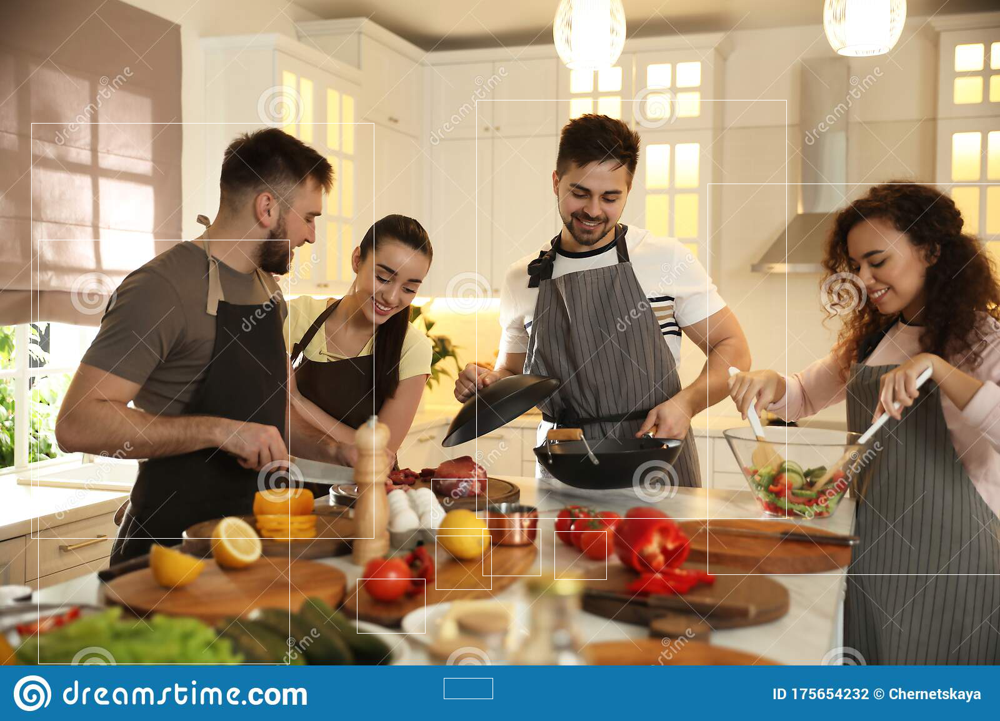

In [ ]:

from PIL import Image
import requests
from io import BytesIO
import torchvision.transforms.functional as TF

response = requests.get(URL_1,headers={'User-Agent': 'Mozilla/5.0'})
img = Image.open(BytesIO(response.content))

device = select_device('')
weights = '/content/yolov5/yolov5s.pt'
imgsz = [img.height, img.width]
original_size = imgsz
model = DetectMultiBackend(weights, device=device, dnn=False)
stride, names, pt, jit, onnx, engine = model.stride, model.names, model.pt, model.jit, model.onnx, model.engine
imgsz = check_img_size(imgsz, s=stride)  # check image size

source = '/content/images/'
half = False
conf_thres=0.25  # confidence threshold
iou_thres=0.45  # NMS IOU threshold
classes = None
agnostic_nms=False,  # class-agnostic NMS
max_det=1000
model.warmup(imgsz=(1, 3, *imgsz))  # warmup
#model.warmup(imgsz=(1, 3, *imgsz), half=half)  # warmup
dt, seen = [0.0, 0.0, 0.0], 0

img2 = img.resize([imgsz[1],imgsz[0]], Image.ANTIALIAS)
    
img_raw = torch.from_numpy(np.asarray(img2)).to(device)
img_raw = img_raw.half() if half else img_raw.float()  
img_raw /= 255  # 0 - 255 to 0.0 - 1.0
img_raw = img_raw.unsqueeze_(0)
img_raw = img_raw.permute(0, 3, 1, 2)
print(img_raw.shape)

pred = model(img_raw, augment=False, visualize=False)
pred = non_max_suppression(pred, conf_thres, iou_thres, classes, agnostic_nms, max_det=max_det)

results = []
for i, det in enumerate(pred):  # per image
  gn = torch.tensor(img_raw.shape)[[1, 0, 1, 0]]  

  if len(det):
      # Rescale boxes from img_size to im0 size
      det[:, :4] = scale_coords(original_size, det[:, :4], imgsz).round()

      # Write results
      for *xyxy, conf, cls in reversed(det):
        xywh = (xyxy2xywh(torch.tensor(xyxy).view(1, 4)) / gn).view(-1).tolist()
        # Choose between xyxy and xywh as your desired format.
        results.append([names[int(cls)], float(conf), [*xyxy]])
for itm in results:
  print(itm)

from PIL import Image, ImageDraw

img3 = img.copy()
draw = ImageDraw.Draw(img3)

for itm in results:
  b = itm[2]
  #print(b)
  draw.rectangle(b)
img3
#cv_imshow(img3)
#cv2_imshow(img3)

## Second Image

YOLOv5 🚀 v6.1-142-g918d7b2 torch 1.10.0+cu111 CUDA:0 (Tesla K80, 11441MiB)

Fusing layers... 
YOLOv5s summary: 213 layers, 7225885 parameters, 0 gradients, 16.5 GFLOPs


torch.Size([1, 3, 1504, 2016])
['person', 0.2510937452316284, [tensor(597., device='cuda:0'), tensor(53., device='cuda:0'), tensor(734., device='cuda:0'), tensor(160., device='cuda:0')]]
['person', 0.25482887029647827, [tensor(1889., device='cuda:0'), tensor(494., device='cuda:0'), tensor(1988., device='cuda:0'), tensor(710., device='cuda:0')]]
['person', 0.26474806666374207, [tensor(653., device='cuda:0'), tensor(558., device='cuda:0'), tensor(1190., device='cuda:0'), tensor(1191., device='cuda:0')]]
['person', 0.3050251603126526, [tensor(1838., device='cuda:0'), tensor(56., device='cuda:0'), tensor(1939., device='cuda:0'), tensor(256., device='cuda:0')]]
['person', 0.30771544575691223, [tensor(183., device='cuda:0'), tensor(240., device='cuda:0'), tensor(300., device='cuda:0'), tensor(426., device='cuda:0')]]
['person', 0.3215571939945221, [tensor(834., device='cuda:0'), tensor(112., device='cuda:0'), tensor(947., device='cuda:0'), tensor(230., device='cuda:0')]]
['person', 0.3427510

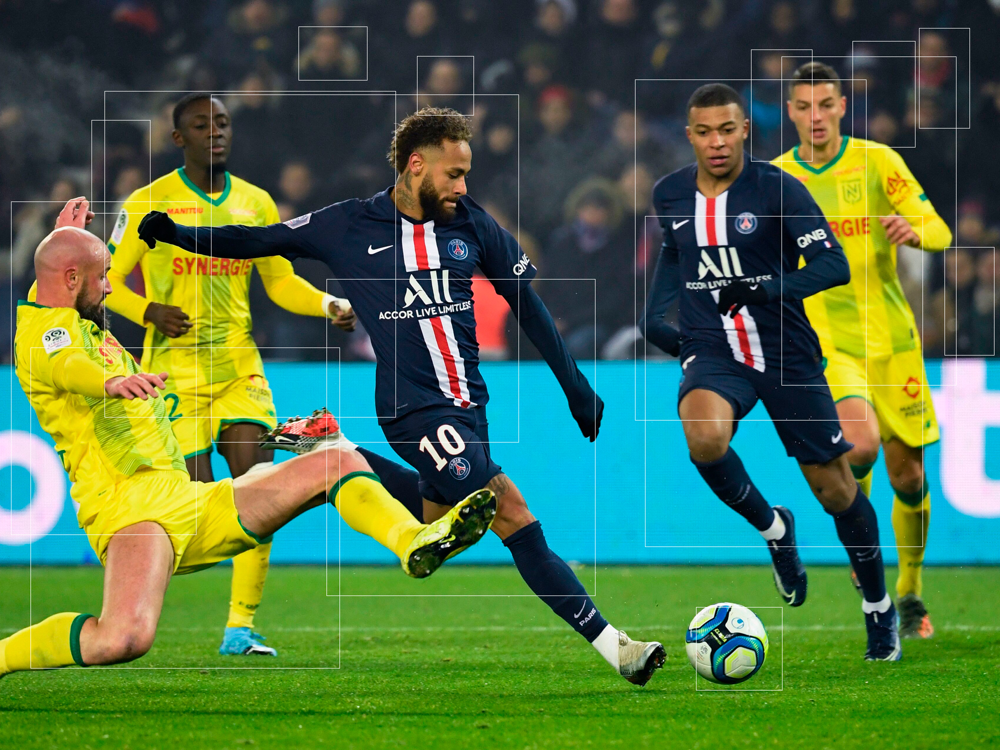

In [ ]:

from PIL import Image
import requests
from io import BytesIO
import torchvision.transforms.functional as TF

response = requests.get(URL_2,headers={'User-Agent': 'Mozilla/5.0'})
img = Image.open(BytesIO(response.content))

device = select_device('')
weights = '/content/yolov5/yolov5s.pt'
imgsz = [img.height, img.width]
original_size = imgsz
model = DetectMultiBackend(weights, device=device, dnn=False)
stride, names, pt, jit, onnx, engine = model.stride, model.names, model.pt, model.jit, model.onnx, model.engine
imgsz = check_img_size(imgsz, s=stride)  # check image size

source = '/content/images/'
half = False
conf_thres=0.25  # confidence threshold
iou_thres=0.45  # NMS IOU threshold
classes = None
agnostic_nms=False,  # class-agnostic NMS
max_det=1000
model.warmup(imgsz=(1, 3, *imgsz))  # warmup
#model.warmup(imgsz=(1, 3, *imgsz), half=half)  # warmup
dt, seen = [0.0, 0.0, 0.0], 0

img2 = img.resize([imgsz[1],imgsz[0]], Image.ANTIALIAS)
    
img_raw = torch.from_numpy(np.asarray(img2)).to(device)
img_raw = img_raw.half() if half else img_raw.float()  
img_raw /= 255  # 0 - 255 to 0.0 - 1.0
img_raw = img_raw.unsqueeze_(0)
img_raw = img_raw.permute(0, 3, 1, 2)
print(img_raw.shape)

pred = model(img_raw, augment=False, visualize=False)
pred = non_max_suppression(pred, conf_thres, iou_thres, classes, agnostic_nms, max_det=max_det)

results = []
for i, det in enumerate(pred):  # per image
  gn = torch.tensor(img_raw.shape)[[1, 0, 1, 0]]  

  if len(det):
      # Rescale boxes from img_size to im0 size
      det[:, :4] = scale_coords(original_size, det[:, :4], imgsz).round()

      # Write results
      for *xyxy, conf, cls in reversed(det):
        xywh = (xyxy2xywh(torch.tensor(xyxy).view(1, 4)) / gn).view(-1).tolist()
        # Choose between xyxy and xywh as your desired format.
        results.append([names[int(cls)], float(conf), [*xyxy]])
for itm in results:
  print(itm)

from PIL import Image, ImageDraw

img3 = img.copy()
draw = ImageDraw.Draw(img3)

for itm in results:
  b = itm[2]
  #print(b)
  draw.rectangle(b)
img3
#cv_imshow(img3)
#cv2_imshow(img3)

## Third Image

YOLOv5 🚀 v6.1-142-g918d7b2 torch 1.10.0+cu111 CUDA:0 (Tesla K80, 11441MiB)

Fusing layers... 
YOLOv5s summary: 213 layers, 7225885 parameters, 0 gradients, 16.5 GFLOPs


torch.Size([1, 3, 1152, 2048])
['person', 0.26172277331352234, [tensor(849., device='cuda:0'), tensor(539., device='cuda:0'), tensor(1479., device='cuda:0'), tensor(1152., device='cuda:0')]]
['chair', 0.30173569917678833, [tensor(244., device='cuda:0'), tensor(1040., device='cuda:0'), tensor(616., device='cuda:0'), tensor(1152., device='cuda:0')]]
['person', 0.39948728680610657, [tensor(542., device='cuda:0'), tensor(478., device='cuda:0'), tensor(1159., device='cuda:0'), tensor(1135., device='cuda:0')]]
['person', 0.491855651140213, [tensor(590., device='cuda:0'), tensor(156., device='cuda:0'), tensor(1235., device='cuda:0'), tensor(817., device='cuda:0')]]
['car', 0.662555992603302, [tensor(1963., device='cuda:0'), tensor(471., device='cuda:0'), tensor(2048., device='cuda:0'), tensor(632., device='cuda:0')]]


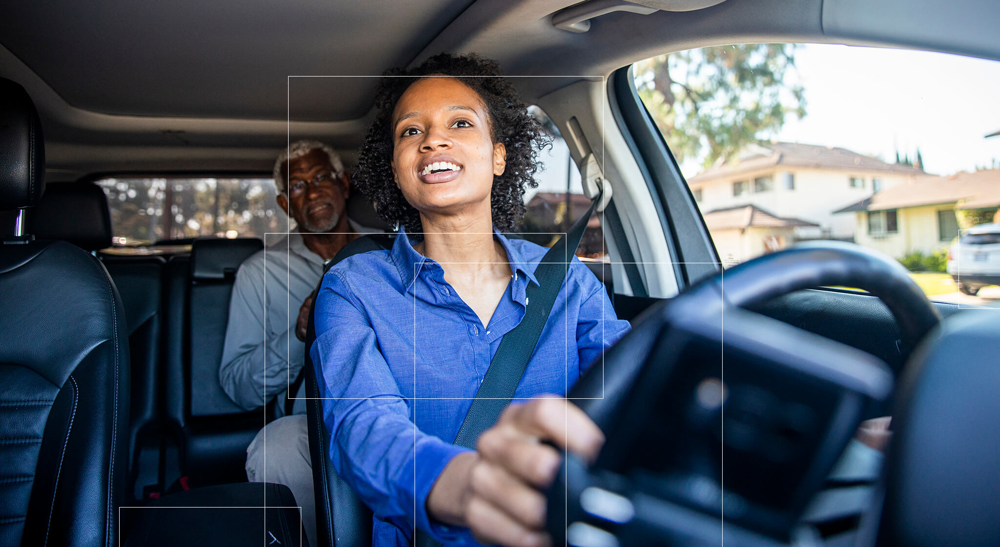

In [ ]:

from PIL import Image
import requests
from io import BytesIO
import torchvision.transforms.functional as TF

response = requests.get(URL_3,headers={'User-Agent': 'Mozilla/5.0'})
img = Image.open(BytesIO(response.content))

device = select_device('')
weights = '/content/yolov5/yolov5s.pt'
imgsz = [img.height, img.width]
original_size = imgsz
model = DetectMultiBackend(weights, device=device, dnn=False)
stride, names, pt, jit, onnx, engine = model.stride, model.names, model.pt, model.jit, model.onnx, model.engine
imgsz = check_img_size(imgsz, s=stride)  # check image size

source = '/content/images/'
half = False
conf_thres=0.25  # confidence threshold
iou_thres=0.45  # NMS IOU threshold
classes = None
agnostic_nms=False,  # class-agnostic NMS
max_det=1000
model.warmup(imgsz=(1, 3, *imgsz))  # warmup
#model.warmup(imgsz=(1, 3, *imgsz), half=half)  # warmup
dt, seen = [0.0, 0.0, 0.0], 0

img2 = img.resize([imgsz[1],imgsz[0]], Image.ANTIALIAS)
    
img_raw = torch.from_numpy(np.asarray(img2)).to(device)
img_raw = img_raw.half() if half else img_raw.float()  
img_raw /= 255  # 0 - 255 to 0.0 - 1.0
img_raw = img_raw.unsqueeze_(0)
img_raw = img_raw.permute(0, 3, 1, 2)
print(img_raw.shape)

pred = model(img_raw, augment=False, visualize=False)
pred = non_max_suppression(pred, conf_thres, iou_thres, classes, agnostic_nms, max_det=max_det)

results = []
for i, det in enumerate(pred):  # per image
  gn = torch.tensor(img_raw.shape)[[1, 0, 1, 0]]  

  if len(det):
      # Rescale boxes from img_size to im0 size
      det[:, :4] = scale_coords(original_size, det[:, :4], imgsz).round()

      # Write results
      for *xyxy, conf, cls in reversed(det):
        xywh = (xyxy2xywh(torch.tensor(xyxy).view(1, 4)) / gn).view(-1).tolist()
        # Choose between xyxy and xywh as your desired format.
        results.append([names[int(cls)], float(conf), [*xyxy]])
for itm in results:
  print(itm)

from PIL import Image, ImageDraw

img3 = img.copy()
draw = ImageDraw.Draw(img3)

for itm in results:
  b = itm[2]
  #print(b)
  draw.rectangle(b)
img3
#cv_imshow(img3)
#cv2_imshow(img3)

## Fourth Image

In [ ]:

from PIL import Image
import requests
from io import BytesIO
import torchvision.transforms.functional as TF

response = requests.get(URL_8,headers={'User-Agent': 'Mozilla/5.0'})
img = Image.open(BytesIO(response.content))

device = select_device('')
weights = '/content/yolov5/yolov5s.pt'
imgsz = [img.height, img.width]
original_size = imgsz
model = DetectMultiBackend(weights, device=device, dnn=False)
stride, names, pt, jit, onnx, engine = model.stride, model.names, model.pt, model.jit, model.onnx, model.engine
imgsz = check_img_size(imgsz, s=stride)  # check image size

source = '/content/images/'
half = False
conf_thres=0.25  # confidence threshold
iou_thres=0.45  # NMS IOU threshold
classes = None
agnostic_nms=False,  # class-agnostic NMS
max_det=1000
model.warmup(imgsz=(1, 3, *imgsz))  # warmup
#model.warmup(imgsz=(1, 3, *imgsz), half=half)  # warmup
dt, seen = [0.0, 0.0, 0.0], 0

img2 = img.resize([imgsz[1],imgsz[0]], Image.ANTIALIAS)
    
img_raw = torch.from_numpy(np.asarray(img2)).to(device)
img_raw = img_raw.half() if half else img_raw.float()  
img_raw /= 255  # 0 - 255 to 0.0 - 1.0
img_raw = img_raw.unsqueeze_(0)
img_raw = img_raw.permute(0, 3, 1, 2)
print(img_raw.shape)

pred = model(img_raw, augment=False, visualize=False)
pred = non_max_suppression(pred, conf_thres, iou_thres, classes, agnostic_nms, max_det=max_det)

results = []
for i, det in enumerate(pred):  # per image
  gn = torch.tensor(img_raw.shape)[[1, 0, 1, 0]]  

  if len(det):
      # Rescale boxes from img_size to im0 size
      det[:, :4] = scale_coords(original_size, det[:, :4], imgsz).round()

      # Write results
      for *xyxy, conf, cls in reversed(det):
        xywh = (xyxy2xywh(torch.tensor(xyxy).view(1, 4)) / gn).view(-1).tolist()
        # Choose between xyxy and xywh as your desired format.
        results.append([names[int(cls)], float(conf), [*xyxy]])
for itm in results:
  print(itm)

from PIL import Image, ImageDraw

img3 = img.copy()
draw = ImageDraw.Draw(img3)

for itm in results:
  b = itm[2]
  #print(b)
  draw.rectangle(b)
img3
#cv_imshow(img3)
#cv2_imshow(img3)

UnidentifiedImageError: ignored

## Fifth Image

YOLOv5 🚀 v6.1-142-g918d7b2 torch 1.10.0+cu111 CUDA:0 (Tesla K80, 11441MiB)

Fusing layers... 
YOLOv5s summary: 213 layers, 7225885 parameters, 0 gradients, 16.5 GFLOPs


torch.Size([1, 3, 1216, 1824])
['chair', 0.2522909641265869, [tensor(404., device='cuda:0'), tensor(641., device='cuda:0'), tensor(448., device='cuda:0'), tensor(679., device='cuda:0')]]
['chair', 0.26425957679748535, [tensor(442., device='cuda:0'), tensor(645., device='cuda:0'), tensor(488., device='cuda:0'), tensor(704., device='cuda:0')]]
['chair', 0.3098115026950836, [tensor(513., device='cuda:0'), tensor(640., device='cuda:0'), tensor(576., device='cuda:0'), tensor(692., device='cuda:0')]]
['chair', 0.328328013420105, [tensor(444., device='cuda:0'), tensor(642., device='cuda:0'), tensor(486., device='cuda:0'), tensor(669., device='cuda:0')]]
['chair', 0.3432126045227051, [tensor(480., device='cuda:0'), tensor(642., device='cuda:0'), tensor(518., device='cuda:0'), tensor(710., device='cuda:0')]]
['bench', 0.37358036637306213, [tensor(778., device='cuda:0'), tensor(642., device='cuda:0'), tensor(830., device='cuda:0'), tensor(675., device='cuda:0')]]
['chair', 0.39501723647117615, [

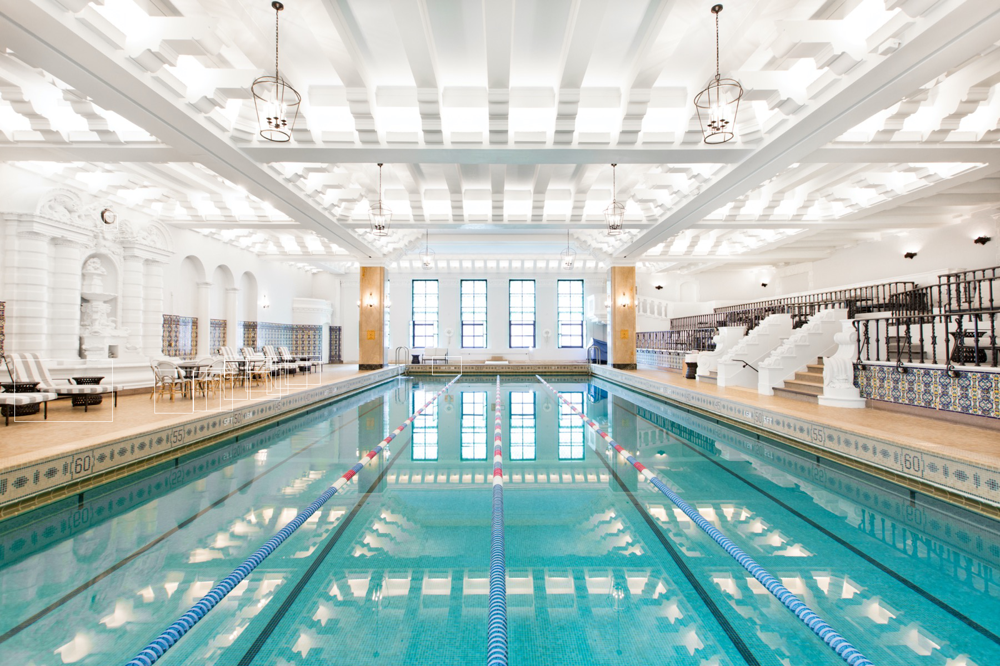

In [ ]:

from PIL import Image
import requests
from io import BytesIO
import torchvision.transforms.functional as TF

response = requests.get(URL_5,headers={'User-Agent': 'Mozilla/5.0'})
img = Image.open(BytesIO(response.content))

device = select_device('')
weights = '/content/yolov5/yolov5s.pt'
imgsz = [img.height, img.width]
original_size = imgsz
model = DetectMultiBackend(weights, device=device, dnn=False)
stride, names, pt, jit, onnx, engine = model.stride, model.names, model.pt, model.jit, model.onnx, model.engine
imgsz = check_img_size(imgsz, s=stride)  # check image size

source = '/content/images/'
half = False
conf_thres=0.25  # confidence threshold
iou_thres=0.45  # NMS IOU threshold
classes = None
agnostic_nms=False,  # class-agnostic NMS
max_det=1000
model.warmup(imgsz=(1, 3, *imgsz))  # warmup
#model.warmup(imgsz=(1, 3, *imgsz), half=half)  # warmup
dt, seen = [0.0, 0.0, 0.0], 0

img2 = img.resize([imgsz[1],imgsz[0]], Image.ANTIALIAS)
    
img_raw = torch.from_numpy(np.asarray(img2)).to(device)
img_raw = img_raw.half() if half else img_raw.float()  
img_raw /= 255  # 0 - 255 to 0.0 - 1.0
img_raw = img_raw.unsqueeze_(0)
img_raw = img_raw.permute(0, 3, 1, 2)
print(img_raw.shape)

pred = model(img_raw, augment=False, visualize=False)
pred = non_max_suppression(pred, conf_thres, iou_thres, classes, agnostic_nms, max_det=max_det)

results = []
for i, det in enumerate(pred):  # per image
  gn = torch.tensor(img_raw.shape)[[1, 0, 1, 0]]  

  if len(det):
      # Rescale boxes from img_size to im0 size
      det[:, :4] = scale_coords(original_size, det[:, :4], imgsz).round()

      # Write results
      for *xyxy, conf, cls in reversed(det):
        xywh = (xyxy2xywh(torch.tensor(xyxy).view(1, 4)) / gn).view(-1).tolist()
        # Choose between xyxy and xywh as your desired format.
        results.append([names[int(cls)], float(conf), [*xyxy]])
for itm in results:
  print(itm)

from PIL import Image, ImageDraw

img3 = img.copy()
draw = ImageDraw.Draw(img3)

for itm in results:
  b = itm[2]
  #print(b)
  draw.rectangle(b)
img3
#cv_imshow(img3)
#cv2_imshow(img3)

# **Task 4:** Generate Minecraft Images with StyleGAN
You may use the same functions introduced in the lectures to generate GAN seeds and images.

In [ ]:
!pip install torch==1.8.1 torchvision==0.9.1
!git clone https://github.com/NVlabs/stylegan2-ada-pytorch.git
!pip install ninja

%tensorflow_version 1.x
!git clone https://github.com/NVlabs/stylegan2-ada.git


     |████████████████████████████████| 804.1 MB 2.5 kB/s 
     |████████████████████████████████| 17.4 MB 529 kB/s 
  Attempting uninstall: torch
    Found existing installation: torch 1.10.0+cu111
    Uninstalling torch-1.10.0+cu111:
      Successfully uninstalled torch-1.10.0+cu111
  Attempting uninstall: torchvision
    Found existing installation: torchvision 0.11.1+cu111
    Uninstalling torchvision-0.11.1+cu111:
      Successfully uninstalled torchvision-0.11.1+cu111
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
torchtext 0.11.0 requires torch==1.10.0, but you have torch 1.8.1 which is incompatible.
torchaudio 0.10.0+cu111 requires torch==1.10.0, but you have torch 1.8.1 which is incompatible.
Cloning into 'stylegan2-ada-pytorch'...
remote: Enumerating objects: 128, done.
remote: Total 128 (delta 0), reused 0 (delta 0), pack-reused 128
Receiving object

In [ ]:
!git clone https://github.com/NVlabs/stylegan3.git
!pip install ninja

! pip install legacy

%tensorflow_version 1.x
import tensorflow as tf

Cloning into 'stylegan3'...
remote: Enumerating objects: 201, done.
remote: Counting objects: 100% (201/201), done.
remote: Compressing objects: 100% (105/105), done.
remote: Total 201 (delta 97), reused 161 (delta 93), pack-reused 0
Receiving objects: 100% (201/201), 4.17 MiB | 9.38 MiB/s, done.
Resolving deltas: 100% (97/97), done.
     |████████████████████████████████| 108 kB 4.3 MB/s 
TensorFlow 1.x selected.


In [ ]:
import sys
sys.path.insert(0, "/content/stylegan3")
import pickle
import os
import numpy as np
import PIL.Image
from IPython.display import Image
import matplotlib.pyplot as plt
import IPython.display
import torch
import dnnlib
import legacy

def seed2vec(G, seed):
  return np.random.RandomState(seed).randn(1, G.z_dim)

def display_image(image):
  plt.axis('off')
  plt.imshow(image)
  plt.show()

def generate_image(G, z, truncation_psi):
    # Render images for dlatents initialized from random seeds.
    Gs_kwargs = {
        'output_transform': dict(func=tflib.convert_images_to_uint8, nchw_to_nhwc=True),
        'randomize_noise': False
    }
    if truncation_psi is not None:
        Gs_kwargs['truncation_psi'] = truncation_psi
    label = np.zeros([1] + G.input_shapes[1][1:])
    images = G.run(z, label, **G_kwargs) # [minibatch, height, width, channel]
    return images[0]

def get_label(G, device, class_idx):
  label = torch.zeros([1, G.c_dim], device=device)
  if G.c_dim != 0:
      if class_idx is None:
          ctx.fail('Must specify class label with --class when using a conditional network')
      label[:, class_idx] = 1
  else:
      if class_idx is not None:
          print ('warn: --class=lbl ignored when running on an unconditional network')
  return label

def generate_image(device, G, z, truncation_psi=1.0, noise_mode='const', class_idx=None):
  z = torch.from_numpy(z).to(device)
  label = get_label(G, device, class_idx)
  img = G(z, label, truncation_psi=truncation_psi, noise_mode=noise_mode)
  img = (img.permute(0, 2, 3, 1) * 127.5 + 128).clamp(0, 255).to(torch.uint8)
  #PIL.Image.fromarray(img[0].cpu().numpy(), 'RGB').save(f'{outdir}/seed{seed:04d}.png')
  return PIL.Image.fromarray(img[0].cpu().numpy(), 'RGB')

In [ ]:
#URL = "https://api.ngc.nvidia.com/v2/models/nvidia/research/stylegan3/versions/1/files/stylegan3-r-ffhq-1024x1024.pkl"
#URL = 'https://github.com/jeffheaton/pretrained-gan-minecraft/releases/download/v1/minecraft-gan-2020-12-22.pkl'
#URL = "https://github.com/jeffheaton/pretrained-gan-fish/releases/download/1.0.0/fish-gan-2020-12-09.pkl"
URL = "https://api.ngc.nvidia.com/v2/models/nvidia/research/stylegan3/versions/1/files/stylegan3-r-ffhq-1024x1024.pkl"

print('Loading networks from "%s"...' % URL)
device = torch.device('cuda')
with dnnlib.util.open_url(URL) as fp:
    G = legacy.load_network_pkl(fp)['G_ema'].requires_grad_(False).to(device) # type: ignore

Loading networks from "https://api.ngc.nvidia.com/v2/models/nvidia/research/stylegan3/versions/1/files/stylegan3-r-ffhq-1024x1024.pkl"...


Seed 2012


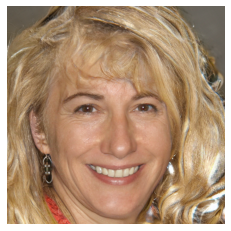

Seed 2013


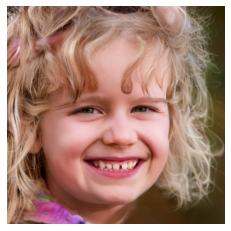

Seed 2014


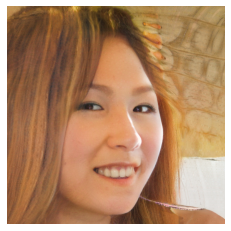

Seed 2015


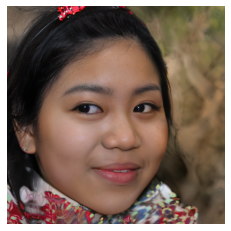

Seed 2016


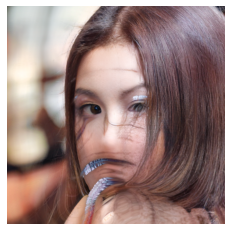

Seed 2017


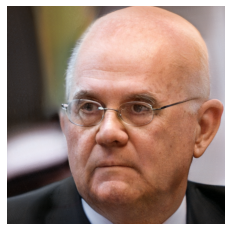

Seed 2018


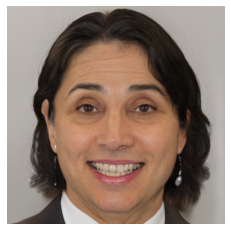

Seed 2019


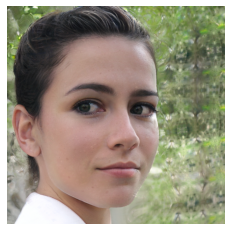

Seed 2020


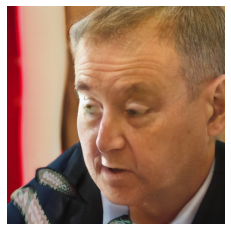

Seed 2021


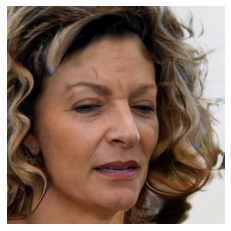

In [ ]:
# Choose your own starting and ending seed.
SEED_FROM = 2012
SEED_TO = 2022

# Generate the images for the seeds.
for i in range(SEED_FROM, SEED_TO):
  print(f"Seed {i}")
  z = seed2vec(G, i)
  img = generate_image(device, G, z)
  display_image(img)

<br/> Try generating a few seeds to evaluate potential starting points for our fine-tuning. Try out different seeds ranges until you have a seed that looks close to what you wish to fine-tune. <br/>
You could use any other StyleGAN pretrained GAN network here (if you wish). 

**Task 5:** Finetune Generated Images


If you find a seed you like, you can fine-tune it by directly adjusting the latent vector. First, choose the seed to fine-tune. Next, generate and display the current vector. You will return to this point for each iteration of the finetuning. 

<br/>
Choose an explore size; this is the number of different images that will be chosen by moving 10 different directions. Run this code once initially and then again anytime you wish to change the ten directions you are exploring. You might change the ten directions if you are no longer seeing improvements.

In [ ]:
START_SEED = 2021
current = seed2vec(G, START_SEED)

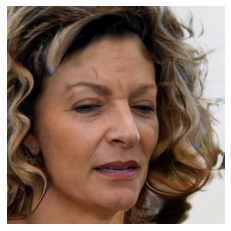

In [ ]:
img = generate_image(device, G, current)
SCALE = 0.5
display_image(img)

In [ ]:
EXPLORE_SIZE = 25
explore = []
for i in range(EXPLORE_SIZE):
  explore.append( np.random.rand(1, 512) - 0.5 )

Direction 0


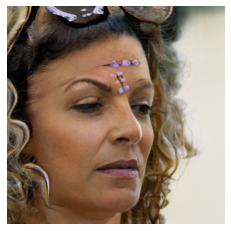

Direction 1


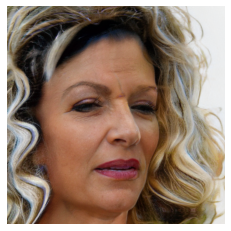

Direction 2


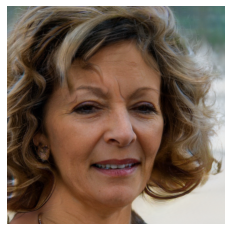

Direction 3


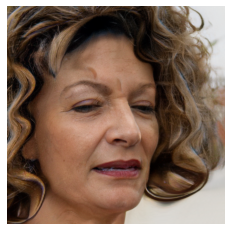

Direction 4


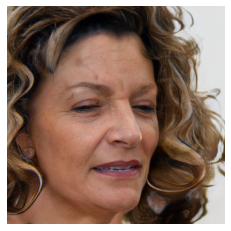

Direction 5


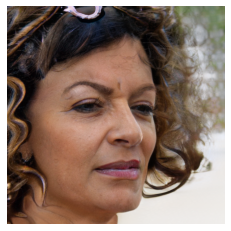

Direction 6


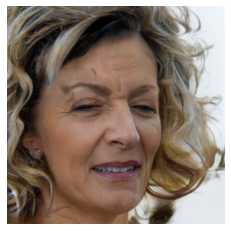

Direction 7


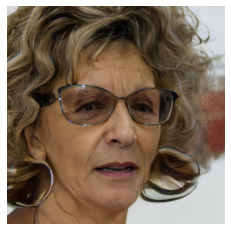

Direction 8


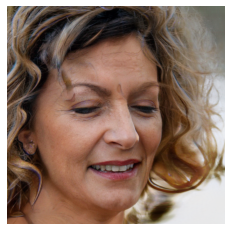

Direction 9


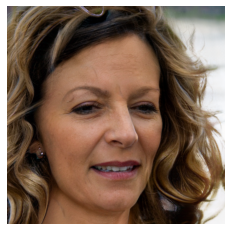

Direction 10


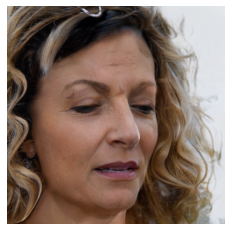

Direction 11


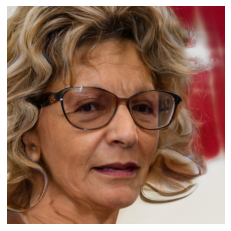

Direction 12


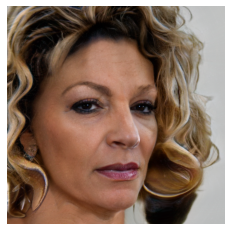

Direction 13


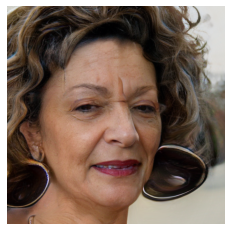

Direction 14


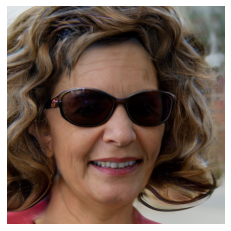

Direction 15


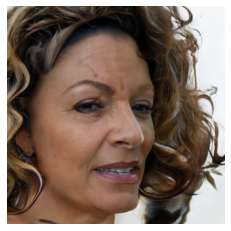

Direction 16


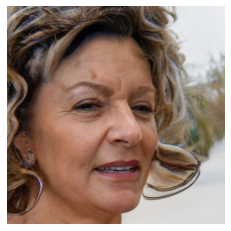

Direction 17


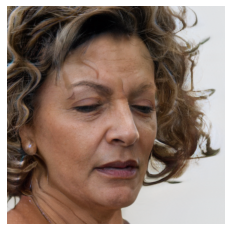

Direction 18


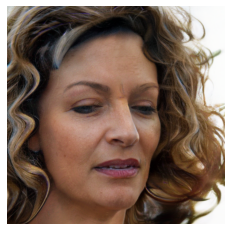

Direction 19


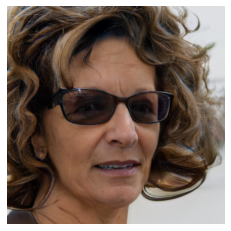

Direction 20


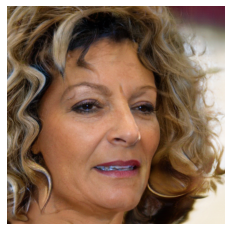

Direction 21


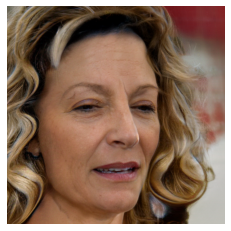

Direction 22


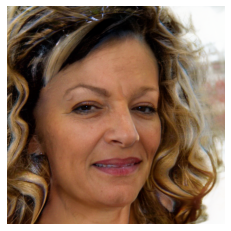

Direction 23


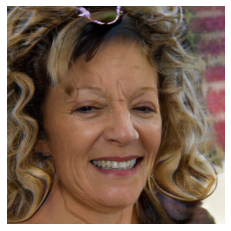

Direction 24


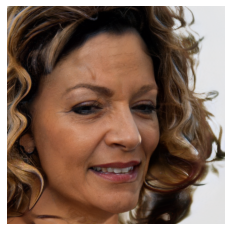

In [ ]:
# Choose the direction to move.  Choose -1 for the initial iteration.   
MOVE_DIRECTION = -1
SCALE = 0.5

if MOVE_DIRECTION >=0:
  current = current + explore[MOVE_DIRECTION]

for i, mv in enumerate(explore):
  print(f"Direction {i}")
  z = current + mv
  img = generate_image(device, G, z)
  display_image(img)

**Task 6:** Morph a video with generated Images

In [ ]:
# Choose your seeds to morph through and the number of steps to take to get to each.

SEEDS = [2013,2019, 2012] # Better for faces
#SEEDS = [1000,1003,1001] # Better for fish
STEPS = 100

# Remove any prior results
!rm /content/results/* 

from tqdm.notebook import tqdm

os.makedirs("./results/", exist_ok=True)

# Generate the images for the video.
idx = 0
for i in range(len(SEEDS)-1):
  v1 = seed2vec(G, SEEDS[i])
  v2 = seed2vec(G, SEEDS[i+1])

  diff = v2 - v1
  step = diff / STEPS
  current = v1.copy()

  for j in tqdm(range(STEPS), desc=f"Seed {SEEDS[i]}"):
    current = current + step
    img = generate_image(device, G, current)
    img.save(f'./results/frame-{idx}.png')
    idx+=1
 
# Link the images into a video.
!ffmpeg -r 30 -i /content/results/frame-%d.png -vcodec mpeg4 -y movie.mp4

Seed 2013:   0%|          | 0/100 [00:00<?, ?it/s]

Seed 2019:   0%|          | 0/100 [00:00<?, ?it/s]

ffmpeg version 3.4.8-0ubuntu0.2 Copyright (c) 2000-2020 the FFmpeg developers
  built with gcc 7 (Ubuntu 7.5.0-3ubuntu1~18.04)
  configuration: --prefix=/usr --extra-version=0ubuntu0.2 --toolchain=hardened --libdir=/usr/lib/x86_64-linux-gnu --incdir=/usr/include/x86_64-linux-gnu --enable-gpl --disable-stripping --enable-avresample --enable-avisynth --enable-gnutls --enable-ladspa --enable-libass --enable-libbluray --enable-libbs2b --enable-libcaca --enable-libcdio --enable-libflite --enable-libfontconfig --enable-libfreetype --enable-libfribidi --enable-libgme --enable-libgsm --enable-libmp3lame --enable-libmysofa --enable-libopenjpeg --enable-libopenmpt --enable-libopus --enable-libpulse --enable-librubberband --enable-librsvg --enable-libshine --enable-libsnappy --enable-libsoxr --enable-libspeex --enable-libssh --enable-libtheora --enable-libtwolame --enable-libvorbis --enable-libvpx --enable-libwavpack --enable-libwebp --enable-libx265 --enable-libxml2 --enable-libxvid --enable-lib

In [ ]:
from google.colab import files
files.download('movie.mp4')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Move between the provided seeds and the generated latent points to create a video.

In [ ]:
print('Done!')

Done!
